# A Framework of Using Machine Learning Approaches for Short-Term Solar Power Forecasting

This work is conducted in University of Regina, Canada Under supervision of Dr. Zhanle (Gerald) Wang. Please don't hesitate to contact, If you would like to collaborate in this regard.

Email: zhanle.wang@uregina.ca

Student Name: Usman Munawar || Email: umx648@uregina.ca
  

# Importing Required Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Importing The Dataset

In [2]:
dataset = pd.read_csv('SolarPrediction.csv')
dataset = dataset.sort_values(['UNIXTime'], ascending = [True])
dataset1 = dataset.sort_values(['UNIXTime'], ascending = [True])
dataset.head()

,UNIXTime,Data,Time,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,TimeSunRise,TimeSunSet
7416,1472724008,9/1/2016 12:00:00 AM,00:00:08,2.58,51,30.43,103,77.27,11.25,06:07:00,18:38:00
7415,1472724310,9/1/2016 12:00:00 AM,00:05:10,2.83,51,30.43,103,153.44,9.00,06:07:00,18:38:00
7414,1472725206,9/1/2016 12:00:00 AM,00:20:06,2.16,51,30.43,103,142.04,7.87,06:07:00,18:38:00
7413,1472725505,9/1/2016 12:00:00 AM,00:25:05,2.21,51,30.43,103,144.12,18.00,06:07:00,18:38:00
7412,1472725809,9/1/2016 12:00:00 AM,00:30:09,2.25,51,30.43,103,67.42,11.25,06:07:00,18:38:00


# Feature Engineering
First step upon importing the dataset was to convert time and date parameters into a more useful format and add some coloumns that may be useful for visualisation, modelling and analysis.

In [3]:
from datetime import datetime
from pytz import timezone
import pytz
hawaii= timezone('Pacific/Honolulu')
dataset.index =  pd.to_datetime(dataset['UNIXTime'], unit='s')
dataset.index = dataset.index.tz_localize(pytz.utc).tz_convert(hawaii)
dataset['MonthOfYear'] = dataset.index.strftime('%m').astype(int)
dataset['DayOfYear'] = dataset.index.strftime('%j').astype(int)
dataset1['DayOfYear'] = dataset.index.strftime('%j').astype(int)
dataset['WeekOfYear'] = dataset.index.strftime('%U').astype(int)
dataset['TimeOfDay(h)'] = dataset.index.hour
dataset['TimeOfDay(m)'] = dataset.index.hour*60 + dataset.index.minute
dataset['TimeOfDay(s)'] = dataset.index.hour*60*60 + dataset.index.minute*60 + dataset.index.second
dataset1['TimeOfDay(s)'] = dataset.index.hour*60*60 + dataset.index.minute*60 + dataset.index.second
dataset['TimeSunRise'] = pd.to_datetime(dataset['TimeSunRise'], format='%H:%M:%S')
dataset['TimeSunSet'] = pd.to_datetime(dataset['TimeSunSet'], format='%H:%M:%S')
dataset['DayLength(s)'] = dataset['TimeSunSet'].dt.hour*60*60 \
                           + dataset['TimeSunSet'].dt.minute*60 \
                           + dataset['TimeSunSet'].dt.second \
                           - dataset['TimeSunRise'].dt.hour*60*60 \
                           - dataset['TimeSunRise'].dt.minute*60 \
                           - dataset['TimeSunRise'].dt.second
dataset.drop(['Data','Time','TimeSunRise','TimeSunSet'], inplace=True, axis=1)

dataset.head()

,UNIXTime,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,MonthOfYear,DayOfYear,WeekOfYear,TimeOfDay(h),TimeOfDay(m),TimeOfDay(s),DayLength(s)
UNIXTime,,,,,,,,,,,,,,
2016-09-01 00:00:08-10:00,1472724008,2.58,51,30.43,103,77.27,11.25,9,245,35,0,0,8,45060
2016-09-01 00:05:10-10:00,1472724310,2.83,51,30.43,103,153.44,9.00,9,245,35,0,5,310,45060
2016-09-01 00:20:06-10:00,1472725206,2.16,51,30.43,103,142.04,7.87,9,245,35,0,20,1206,45060
2016-09-01 00:25:05-10:00,1472725505,2.21,51,30.43,103,144.12,18.00,9,245,35,0,25,1505,45060
2016-09-01 00:30:09-10:00,1472725809,2.25,51,30.43,103,67.42,11.25,9,245,35,0,30,1809,45060


# Feature Visualisation
Next, in order to get a better understanding of the data, hourly and monthly means of several variables were visualised using bar plots.

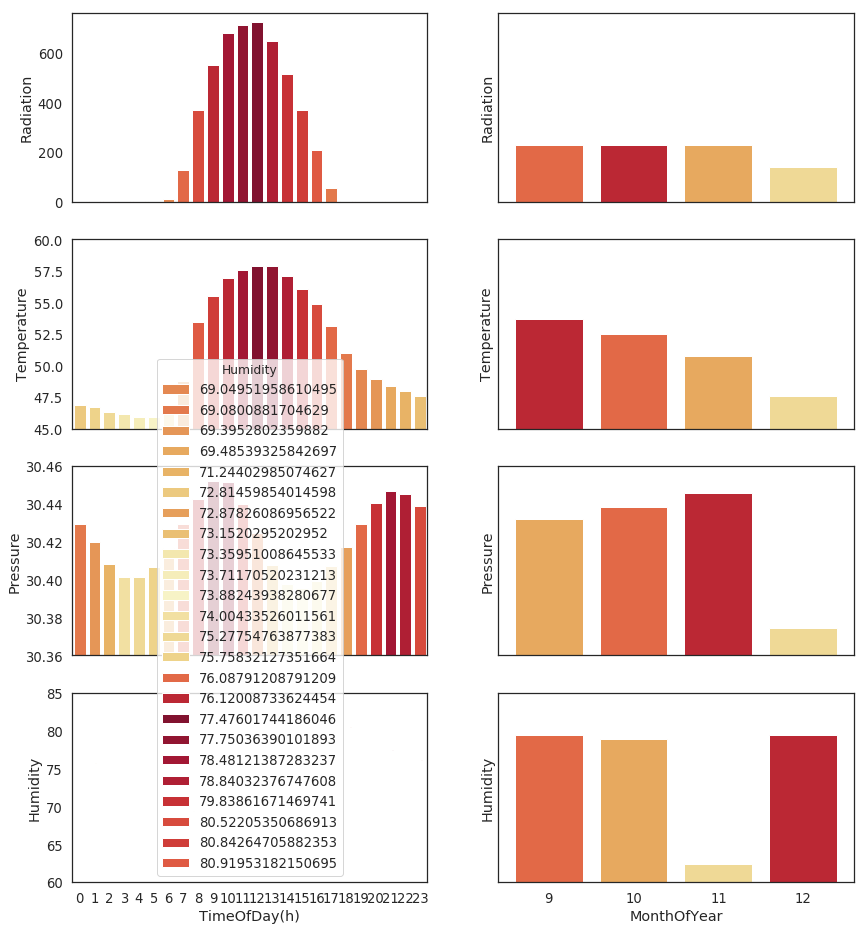

In [28]:
grouped_m=dataset.groupby('MonthOfYear').mean().reset_index()
grouped_w=dataset.groupby('WeekOfYear').mean().reset_index()
grouped_d=dataset.groupby('DayOfYear').mean().reset_index()
grouped_h=dataset.groupby('TimeOfDay(h)').mean().reset_index()

f, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, sharex='col', sharey='row', figsize=(14,16))
ax3.set_ylim(45,60)
ax5.set_ylim(30.36,30.46)
ax7.set_ylim(60,85)

#seaborn.set(context='notebook', style='darkgrid', palette='deep', font='Times-New-Roman', font_scale=1, color_codes=True, rc=None)
sns.set(font='Times New Roman', font_scale=1.2, style='white')


#ax1.set_title('Mean Radiation by Hour', fontsize=10)
pal = sns.color_palette("YlOrRd_r", len(grouped_h))
rank = grouped_h['Radiation'].argsort().argsort() 
g = sns.barplot(x="TimeOfDay(h)", y='Radiation', data=grouped_h, palette=np.array(pal[::-1])[rank], ax=ax1)
ax1.set_xlabel('')

#ax2.set_title('Mean Radiation by Month', fontsize=10)
pal = sns.color_palette("YlOrRd_r", len(grouped_m))
rank = grouped_m['Radiation'].argsort().argsort() 
g = sns.barplot(x="MonthOfYear", y='Radiation', data=grouped_m, palette=np.array(pal[::-1])[rank], ax=ax2)
ax2.set_xlabel('')

#ax3.set_title('Mean Temperature by Hour', fontsize=10)
pal = sns.color_palette("YlOrRd_r", len(grouped_h))
rank = grouped_h['Temperature'].argsort().argsort() 
g = sns.barplot(x="TimeOfDay(h)", y='Temperature', data=grouped_h, palette=np.array(pal[::-1])[rank], ax=ax3)
ax3.set_xlabel('')

#ax4.set_title('Mean Temperature by Month', fontsize=10)
pal = sns.color_palette("YlOrRd_r", len(grouped_m))
rank = grouped_m['Temperature'].argsort().argsort() 
g = sns.barplot(x="MonthOfYear", y='Temperature', data=grouped_m, palette=np.array(pal[::-1])[rank], ax=ax4)
ax4.set_xlabel('')

#ax5.set_title('Mean Pressure by Hour', fontsize=10)
pal = sns.color_palette("YlOrRd_r", len(grouped_h))
rank = grouped_h['Pressure'].argsort().argsort() 
g = sns.barplot(x="TimeOfDay(h)", y='Pressure', data=grouped_h, palette=np.array(pal[::-1])[rank], ax=ax5)
ax5.set_xlabel('')

#ax6.set_title('Mean Pressure by Month', fontsize=10)
pal = sns.color_palette("YlOrRd_r", len(grouped_m))
rank = grouped_m['Pressure'].argsort().argsort() 
g = sns.barplot(x="MonthOfYear", y='Pressure', data=grouped_m, palette=np.array(pal[::-1])[rank], ax=ax6)
ax6.set_xlabel('')

#ax7.set_title('Mean Humidity by Hour', fontsize=10)
pal = sns.color_palette("YlOrRd_r", len(grouped_h))
rank = grouped_h['Humidity'].argsort().argsort() 
g = sns.barplot(x="TimeOfDay(h)", y='Humidity', data=grouped_h,hue='Humidity',palette=np.array(pal[::-1])[rank], ax=ax7)


#ax8.set_title('Mean Humidity by Month', fontsize=10)
pal = sns.color_palette("YlOrRd_r", len(grouped_m))
rank = grouped_m['Humidity'].argsort().argsort() 
g = sns.barplot(x="MonthOfYear", y='Humidity', data=grouped_m,palette=np.array(pal[::-1])[rank],ax=ax8)
plt.plot(palette=np.array(pal[::-1])[rank])

#f.savefig('myimage1.png', format='png', dpi=500)

In [30]:
import seaborn as sns; sns.set()
sns.palplot(sns.color_palette(ran))

ValueError: Could not generate a palette for <map object at 0x7f77293f38d0>

# Pearson Correlation
To further help visualise any realtionships between the variables, a pearson correlation heatmap was plotted.

From the plots in the previous section it is clear that solar irradiance does not have a linear correlation with time of day. Therefore, despite the strong realtionship between the two, 'TimeOfDay' columns were excluded from the heatmap. 'UNIXTime', 'MonthOfYear' and 'WeekOfYear' were also excluded because it is likely to more useful to use a combination of 'TimeOfDay' and 'DayOfYear' in training and prediction.

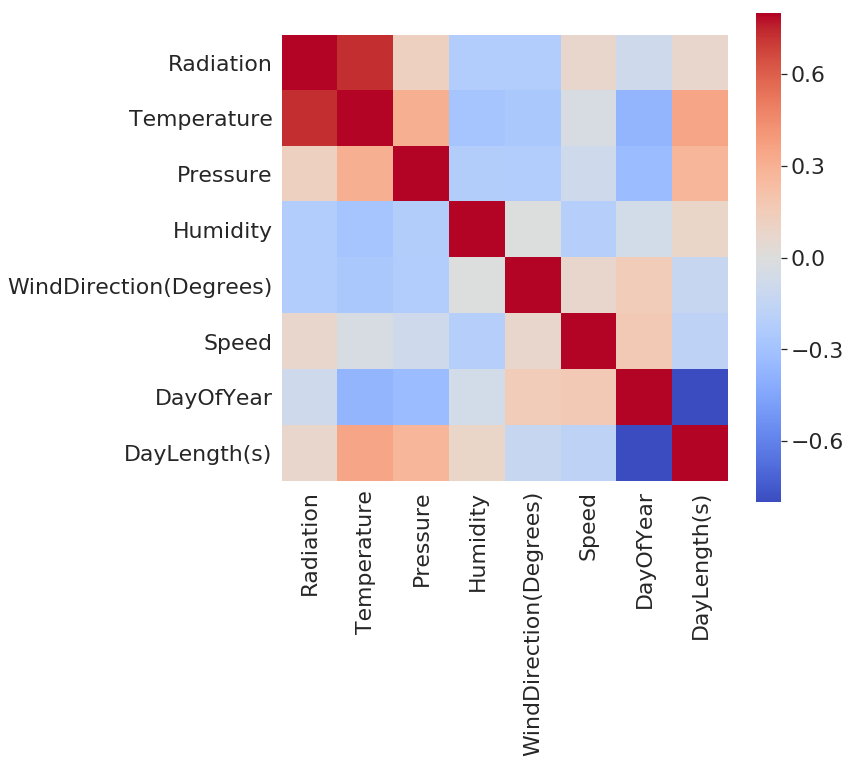

In [34]:
corrmat = dataset.drop(['TimeOfDay(h)', 'TimeOfDay(m)', 'TimeOfDay(s)', 'UNIXTime', 'MonthOfYear', 'WeekOfYear'], inplace=False, axis=1)
sns.set(font_scale=2)
corrmat = corrmat.corr()
f, ax = plt.subplots(figsize=(10,9))
sns.heatmap(corrmat, vmin=-.8, vmax=.8, square=True, cmap = 'coolwarm')
ax.set_ylabel('')    
ax.set_xlabel('')
f.savefig('myimage11.png', format='png', dpi=500, bbox_inches = 'tight')
#plt.savefig('image121.png', format='png', dpi=500,bbox_inches = 'tight')

# Separating the Independent and Dependent Variables
All recorded meteorological variables, except solar irradiance, were included in the independent variables. 'DayOfYear' and 'TimeOfDay(s)' were selected to represent date and time. This would ensure no problems were encountered if predictions for another year were to be made.

Solar Irradiance was of course set as the independent variable.

In [7]:
X = dataset[['Temperature', 'Pressure', 'Humidity', 'WindDirection(Degrees)', 'Speed', 'DayOfYear', 'TimeOfDay(s)']]
y = dataset['Radiation']

# Splitting the Dataset
The dataset was subsequently split into a training and test set, with an 80%, 20% split respectively.

In [8]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# Feature Selection
Although linear regressors can be used to estimate the importance of different features, it was felt that in this situation, with relatively nonlinear data, that this method would not be suitable. Fortunately, sci-kit learn's decision tree based regressors contain a feature importance attribute. This attribute was used to perform a backwards elimination procedure, where the least important feature of the regressor was repeatedly removed and the r2 scores, from cross validation, of each model were recorded.

In [9]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
regressor = RandomForestRegressor(n_estimators = 100)
regressor.fit(X_train, y_train)
feature_importances = regressor.feature_importances_

X_train_opt = X_train.copy()
removed_columns = pd.DataFrame()
models = []
r2s_opt = []

for i in range(0,5):
    least_important = np.argmin(feature_importances)
    #print(least_important)
    removed_columns = removed_columns.append(X_train_opt.pop(X_train_opt.columns[least_important]))
    #print(removed_columns)
    regressor.fit(X_train_opt, y_train)
    feature_importances = regressor.feature_importances_
    #print(feature_importances)
    accuracies = cross_val_score(estimator = regressor,
                                 X = X_train_opt,
                                 y = y_train, cv = 10,
                                 scoring = 'r2')
    r2s_opt = np.append(r2s_opt, accuracies.mean())
    models = np.append(models, ", ".join(list(X_train_opt)))
    
feature_selection = pd.DataFrame({'Features':models,'r2 Score':r2s_opt})
feature_selection.head()

,Features,r2 Score
0,"Temperature, Pressure, Humidity, WindDirection...",0.934014
1,"Temperature, Humidity, WindDirection(Degrees),...",0.932894
2,"Temperature, Humidity, DayOfYear, TimeOfDay(s)",0.935933
3,"Temperature, DayOfYear, TimeOfDay(s)",0.933991
4,"Temperature, TimeOfDay(s)",0.798566


In [10]:
X_train_best = X_train[['Temperature', 'DayOfYear', 'TimeOfDay(s)']]
X_test_best = X_test[['Temperature', 'DayOfYear', 'TimeOfDay(s)']]
X_best = X[['Temperature', 'DayOfYear', 'TimeOfDay(s)']]

In [32]:
from sklearn.decomposition import PCA
from sklearn.neural_network import MLPRegressor
X1 = dataset[['Temperature', 'Pressure', 'Humidity', 'WindDirection(Degrees)', 'Speed', 'DayOfYear', 'TimeOfDay(s)']]
y1 = dataset['Radiation']
pca = PCA(n_components=7)
principalComponents = pca.fit_transform(X1)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1','principal component 1','principal component 1','principal component 1','principal component 1','principal component 1','principal component 1'])
X3 = principalDf/100
from sklearn.model_selection import train_test_split
X_train1, X_test1, y_train1, y_test1 = train_test_split(X3, y1, test_size = 0.1, random_state = 0)
X_train1.head()

,principal component 1,principal component 1,principal component 1,principal component 1,principal component 1,principal component 1,principal component 1
21334,-185.414300,-0.186876,-0.207301,0.195096,0.000772,0.009662,0.000307
223,-350.284332,-0.221813,0.596389,-0.040740,-0.053542,0.064528,-0.000133
28414,312.605897,0.549652,-0.418496,-0.011878,-0.031108,0.004118,0.001368
4818,-233.274365,-0.317379,0.416159,-0.192045,-0.034853,-0.025291,0.000498
29386,-20.394475,-0.820244,-0.556866,0.038071,0.080601,-0.013129,-0.000895


Random Forest

In [11]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
regressor.fit(X_train_best, y_train)   # Random forest 
y_pred = regressor.predict(X_test_best)
explained_variance_score = explained_variance_score(y_test, y_pred)
mean_squared_error = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)
print('explained variance = {}'.format(explained_variance_score))
print('mse = {}'.format(mean_squared_error))
print('r2 = {}'.format(r_squared))

explained variance = 0.9393889599183874
mse = 6253.42113183028
r2 = 0.9393343019691165


# Cross Validation
Cross validation, with a greater number of folds, again shows an r2 score of 0.93.

In [12]:
accuracies = cross_val_score(estimator = regressor, X = X_train_best,y = y_train, cv = 10, scoring = 'r2')
accuracy = accuracies.mean()
print('r2 = {}'.format(accuracy))

r2 = 0.9341414400016879


# Visualising the Model
In order to visualise the model, predictions were made for the entire dataset and an interactive plot created using the 'bokeh' library.

In [27]:
# Predicting for whole dataset
dataset['y_pred'] = regressor.predict(dataset[['Temperature', 'DayOfYear', 'TimeOfDay(s)']])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.plotting import figure, output_file, show
output_file("legend.label.html")
from bokeh.models import Range1d
from bokeh.models import Axis
from bokeh.models.glyphs import Text
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.xaxis.major_label_text_color = "Black"
p.xaxis.axis_label_text_font_style = "normal"
p.xaxis.axis_label_text_font = "times"
p.yaxis.major_label_text_color = "Black"
p.yaxis.axis_label_text_font_style = "normal"
p.yaxis.axis_label_text_font = "times"
p.axis.major_label_text_font_size = "normal"
p.axis.major_label_text_font_size = "times"
p.axis.major_label_text_color = "Black"

p.axis.major_label_text_font_size = '25pt'
p.yaxis.axis_label_text_font_size = "25pt"
p.xaxis.axis_label_text_font_size = "25pt"

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend='Observed Solar Irradiance', line_width=2)
p.line(dataset.index, dataset['y_pred'], legend='Predicted Solar Irradiance', line_width=2, line_color="red")

p.legend.label_text_font_size = '25pt'
p.legend.label_text_font = "times"
p.legend.label_text_font_style = "normal"
p.legend.label_text_color = "Black"



show(p)

Loading BokehJS ...

In [19]:
df = pd.DataFrame(dataset['y_pred'])
df.to_csv('RF_FI.csv')   # conversion to csv

In [20]:
dk=pd.DataFrame(dataset['Radiation'])
dk.to_csv('original_RF_FI.csv')   # conversion to csv

Random forest with PCA

In [33]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
regressor = RandomForestRegressor(n_estimators = 100)
regressor.fit(X_train1,y_train1)   # Random forest X_train1, X_test1, y_train1, y_test1
y_pred = regressor.predict(X_test1)
explained_variance_score = explained_variance_score(y_test1, y_pred)
mean_squared_error = mean_squared_error(y_test1, y_pred)
r_squared = r2_score(y_test1, y_pred)
print('explained variance = {}'.format(explained_variance_score))
print('mse = {}'.format(mean_squared_error))
print('r2 = {}'.format(r_squared))

explained variance = 0.9246808961797687
mse = 7723.989776698037
r2 = 0.9246578016724751


In [21]:
accuracies = cross_val_score(estimator = regressor, X = X_train1,y = y_train1, cv = 10, scoring = 'r2')
accuracy = accuracies.mean()
print('r2 = {}'.format(accuracy))

r2 = 0.7402043185001


In [30]:
# Predicting for whole dataset
dataset['y_pred1_1'] = regressor.predict(X3)

# Create Interactive Plot Using Bokeh

from bokeh.models import Range1d
output_notebook() 
from bokeh.plotting import figure, output_file, show
from bokeh.models.glyphs import Text

output_file("legend.label.html")

p = figure(plot_width=800, 
           plot_height=400,
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.xaxis.axis_label_text_font_style = "normal"
p.xaxis.axis_label_text_font = "times"
p.xaxis.major_label_text_color = "Black"
p.yaxis.major_label_text_color = "Black"
p.yaxis.axis_label_text_font_style = "normal"
p.yaxis.axis_label_text_font = "times"
p.axis.major_label_text_font_size = "normal"
p.axis.major_label_text_font_size = "times"
p.axis.major_label_text_color = "Black"

p.axis.major_label_text_font_size = '25pt'
p.yaxis.axis_label_text_font_size = "25pt"
p.xaxis.axis_label_text_font_size = "25pt"

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend='Observed Solar Irradiance', line_width=2)
p.line(dataset.index, dataset['y_pred1_1'], legend='Predicted Solar Irradiance', line_width=2, line_color="red")

p.legend.label_text_font_size = '25pt'
p.legend.label_text_font = "times"
p.legend.label_text_font_style = "normal"
p.legend.label_text_color = "Black"

show(p, notebook_handle = True)

Loading BokehJS ...

In [31]:
pip install xgboost

  Using cached https://files.pythonhosted.org/packages/c1/24/5fe7237b2eca13ee0cfb100bec8c23f4e69ce9df852a64b0493d49dae4e0/xgboost-0.90-py2.py3-none-manylinux1_x86_64.whl
Note: you may need to restart the kernel to use updated packages.


xgboost with Random forest

In [32]:
import xgboost as xgb
xgb_params = {
    'n_trees': 70, 
    'eta': 0.05,
    'max_depth': 13,
    'subsample': 0.7,
    'objective': 'reg:linear',
    'eval_metric': 'rmse',
    'silent': 1
}
dtrain = xgb.DMatrix(X_train_best, y_train)
dtest = xgb.DMatrix(X_test_best)
dall = xgb.DMatrix(X_best)

/opt/conda/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


In [96]:
cv_output = xgb.cv(xgb_params, dtrain, num_boost_round=2000, early_stopping_rounds=100,
    verbose_eval=200, show_stdv=False)

[0]	train-rmse:359.516	test-rmse:359.933
[200]	train-rmse:2.49082	test-rmse:94.1406


KeyError: "None of [Index(['training', 'testing'], dtype='object')] are in the [columns]"

In [101]:
cv_output['Training'] = cv_output['train-rmse-mean']
cv_output['Testing'] = cv_output['test-rmse-mean']

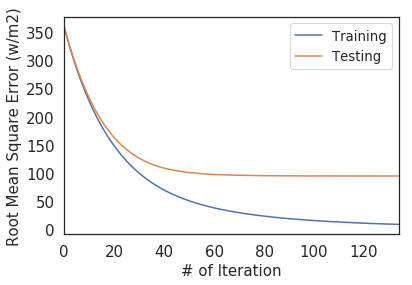

In [106]:
cv_output['Training'] = cv_output['train-rmse-mean']
cv_output['Testing'] = cv_output['test-rmse-mean']
cv_output[['Training', 'Testing']].plot(fontsize=15)
plt.ylabel('Root Mean Square Error (w/m2)',fontsize=15)
plt.xlabel('# of Iteration',fontsize=15)
plt.show()

In [107]:
num_boost_rounds = len(cv_output)
print(num_boost_rounds)
model = xgb.train(dict(xgb_params, silent=0), dtrain, num_boost_round= num_boost_rounds)

135
[02:43:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [108]:
from sklearn.metrics import r2_score
print("R^2 in training: %s"  % r2_score(dtrain.get_label(), model.predict(dtrain)))
print("R^2 in testing: %s"  % r2_score(y_test, model.predict(dtest)))

R^2 in training: 0.9994711147103034


ValueError: Found input variables with inconsistent numbers of samples: [6538, 3269]

In [37]:
# Predicting for whole dataset
dataset['y_pred1_2'] = model.predict(dall)

# Create Interactive Plot Using Bokeh

from bokeh.plotting import figure, output_file, show
from bokeh.models.glyphs import Text
from bokeh.models import Range1d
output_notebook() 

output_file("legend.label.html")


p = figure(plot_width=800, 
           plot_height=400,
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.xaxis.axis_label_text_font_style = "normal"
p.xaxis.axis_label_text_font = "times"
p.xaxis.major_label_text_color = "Black"
p.yaxis.major_label_text_color = "Black"
p.yaxis.axis_label_text_font_style = "normal"
p.yaxis.axis_label_text_font = "times"
p.axis.major_label_text_font_size = "normal"
p.axis.major_label_text_font_size = "times"
p.axis.major_label_text_color = "Black"

p.axis.major_label_text_font_size = '25pt'
p.yaxis.axis_label_text_font_size = "25pt"
p.xaxis.axis_label_text_font_size = "25pt"

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend='Observed Solar Irradiance', line_width=2)
p.line(dataset.index, dataset['y_pred1_2'], legend='Predicted Solar Irradiance', line_width=2, line_color="red")

p.legend.label_text_font_size = '25pt'
p.legend.label_text_font = "times"
p.legend.label_text_font_style = "normal"
p.legend.label_text_color = "Black"



show(p, notebook_handle = True)

Loading BokehJS ...

xgboost with PCA

In [112]:
import xgboost as xgb
xgb_params = {
    'n_trees': 90, 
    'eta': 0.05,
    'max_depth': 35,
    'subsample': 0.7,
    'objective': 'reg:linear',
    'eval_metric': 'rmse',
    'silent': 1
}
dtrain = xgb.DMatrix(X_train1, y_train1)
dtest = xgb.DMatrix(X_test1)
dall = xgb.DMatrix(X3)

In [113]:
cv_output = xgb.cv(xgb_params, dtrain, num_boost_round=2000, early_stopping_rounds=100,
    verbose_eval=200, show_stdv=False)

[0]	train-rmse:359.516	test-rmse:359.933
[200]	train-rmse:2.49082	test-rmse:94.1406


In [114]:
cv_output['Training'] = cv_output['train-rmse-mean']
cv_output['Testing'] = cv_output['test-rmse-mean']

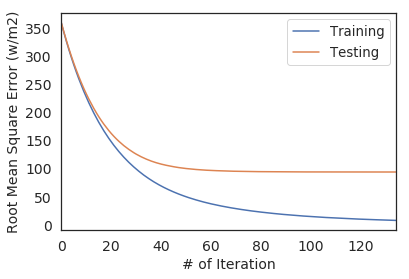

<Figure size 432x288 with 0 Axes>

In [126]:
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "Times New Roman"

cv_output[['Training', 'Testing']].plot(fontsize=14)
plt.ylabel('Root Mean Square Error (w/m2)',fontsize=14)
plt.xlabel('# of Iteration',fontsize=14)
plt.show()
plt.savefig('image1234.png', format='png', dpi=500,bbox_inches = 'tight')

In [40]:
num_boost_rounds = len(cv_output)
print(num_boost_rounds)
model = xgb.train(dict(xgb_params, silent=0), dtrain, num_boost_round= num_boost_rounds)

135
[01:17:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [41]:
from sklearn.metrics import r2_score
print("R^2 in training: %s"  % r2_score(dtrain.get_label(), model.predict(dtrain)))
print("R^2 in testing: %s"  % r2_score(y_test1, model.predict(dtest)))

R^2 in training: 0.9994711147103034
R^2 in testing: 0.9208273261551133


In [42]:
# Predicting for whole dataset
dataset['y_pred1_2'] = model.predict(dall)

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.plotting import figure, output_file, show
from bokeh.models.glyphs import Text
output_file("legend.label.html")
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.xaxis.axis_label_text_font_style = "normal"
p.xaxis.axis_label_text_font = "times"
p.xaxis.major_label_text_color = "Black"
p.yaxis.major_label_text_color = "Black"
p.yaxis.axis_label_text_font_style = "normal"
p.yaxis.axis_label_text_font = "times"
p.axis.major_label_text_font_size = "normal"
p.axis.major_label_text_font_size = "times"
p.axis.major_label_text_color = "Black"

p.axis.major_label_text_font_size = '25pt'
p.yaxis.axis_label_text_font_size = "25pt"
p.xaxis.axis_label_text_font_size = "25pt"

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend='Observed Solar Irradiance', line_width=2)
p.line(dataset.index, dataset['y_pred1_2'], legend='Predicted Solar Irradiance', line_width=2, line_color="red")


p.legend.label_text_font_size = '25pt'
p.legend.label_text_font = "times"
p.legend.label_text_font_style = "normal"
p.legend.label_text_color = "Black"

show(p, notebook_handle = True)



Loading BokehJS ...

LinearRegression with Random forest

In [124]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn import svm
from sklearn import preprocessing
from sklearn import utils
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier

In [125]:
from sklearn import linear_model
lin_reg = linear_model.LinearRegression()
lin_reg.fit(X_train_best, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [126]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
y_pred2 = lin_reg.predict(X_test_best)
explained_variance_score2 = explained_variance_score(y_test, y_pred2)
mean_squared_error2 = mean_squared_error(y_test, y_pred2)
r_squared2 = r2_score(y_test, y_pred2)
print('explained variance = {}'.format(explained_variance_score2))
print('mse = {}'.format(mean_squared_error2))
print('r2 = {}'.format(r_squared2))
print(y_pred2)



explained variance = 0.614737216800166
mse = 39744.4494885286
r2 = 0.6144310897594896
[263.99242355 821.30316578 299.42727969 ... 318.26875519  89.9596929
  35.68748624]


In [127]:
# Predicting for whole dataset
dataset['y_pred2'] = lin_reg.predict(dataset[['Temperature', 'DayOfYear', 'TimeOfDay(s)']])
# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Solar Irradiance Predictions",
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.title.text_font_size= '10pt'
p.axis.major_label_text_font_size = '10pt'
p.yaxis.axis_label_text_font_size = "10pt"
p.xaxis.axis_label_text_font_size = "10pt"

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend='Observed Solar Irradiance', line_width=2)
p.line(dataset.index, dataset['y_pred2'], legend='Predicted Solar Irradiance', line_width=2, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

LinearRegression with PCA

In [128]:
from sklearn import linear_model
lin_reg = linear_model.LinearRegression()
lin_reg.fit(X_train1, y_train1)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [129]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
y_pred2 = lin_reg.predict(X_test1)
explained_variance_score2 = explained_variance_score(y_test1, y_pred2)
mean_squared_error2 = mean_squared_error(y_test1, y_pred2)
r_squared2 = r2_score(y_test1, y_pred2)
print('explained variance = {}'.format(explained_variance_score2))
print('mse = {}'.format(mean_squared_error2))
print('r2 = {}'.format(r_squared2))
print(y_pred2)

explained variance = 0.13747008284686202
mse = 88451.92634421833
r2 = 0.13721240320871964
[373.9239099  166.24006857 303.14487668 ... 274.3535799  147.03184465
 283.26878508]


In [130]:
# Predicting for whole dataset
dataset['y_pred2'] = lin_reg.predict(X3)
# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Solar Irradiance Predictions",
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.title.text_font_size= '10pt'
p.axis.major_label_text_font_size = '10pt'
p.yaxis.axis_label_text_font_size = "10pt"
p.xaxis.axis_label_text_font_size = "10pt"

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend='Observed Solar Irradiance', line_width=2)
p.line(dataset.index, dataset['y_pred2'], legend='Predicted Solar Irradiance', line_width=2, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

DecisionTreeRegressor with Random forest 

In [131]:
from sklearn.tree import DecisionTreeRegressor as DTR

# fit random forest
dt = DTR(min_samples_leaf=5,min_samples_split=3)
dt.fit(X_train_best, y_train)

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=5,
           min_samples_split=3, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [132]:
accuracies1 = cross_val_score(estimator =dt , X = X_train_best,y = y_train, cv = 10, scoring = 'r2')
accuracy = accuracies1.mean()
print('r2 = {}'.format(accuracy))

r2 = 0.9171090915051241


In [133]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
y_pred3 = dt.predict(X_test_best)
explained_variance_score3 = explained_variance_score(y_test, y_pred3)
mean_squared_error3 = mean_squared_error(y_test, y_pred3)
r_squared3 = r2_score(y_test, y_pred3)
print('explained variance = {}'.format(explained_variance_score3))
print('mse = {}'.format(mean_squared_error3))
print('r2 = {}'.format(r_squared3))
print(y_pred3)


explained variance = 0.9206973576006143
mse = 8180.177868700729
r2 = 0.9206424467567773
[  1.22       908.19166667 360.375      ... 575.92         1.218
   1.21      ]


In [135]:
# Predicting for whole dataset
dataset['y_pred3'] = dt.predict(dataset[['Temperature', 'DayOfYear', 'TimeOfDay(s)']])
# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Solar Irradiance Predictions",
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.title.text_font_size= '10pt'
p.axis.major_label_text_font_size = '10pt'
p.yaxis.axis_label_text_font_size = "10pt"
p.xaxis.axis_label_text_font_size = "10pt"

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend='Observed Solar Irradiance', line_width=2)
p.line(dataset.index, dataset['y_pred3'], legend='Predicted Solar Irradiance', line_width=2, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

DecisionTreeRegressor with PCA

In [136]:
from sklearn.tree import DecisionTreeRegressor as DTR

# fit random forest
dt = DTR(min_samples_leaf=5,min_samples_split=3)
dt.fit(X_train1, y_train1)

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=5,
           min_samples_split=3, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [137]:
accuracies1 = cross_val_score(estimator =dt , X = X_train1,y = y_train1, cv = 10, scoring = 'r2')
accuracy = accuracies1.mean()
print('r2 = {}'.format(accuracy))

r2 = 0.8788514588455522


In [138]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
y_pred5 = dt.predict(X_test1)
explained_variance_score4 = explained_variance_score(y_test1, y_pred5)
mean_squared_error4 = mean_squared_error(y_test1, y_pred5)
r_squared4 = r2_score(y_test1, y_pred5)
print('explained variance = {}'.format(explained_variance_score4))
print('mse = {}'.format(mean_squared_error4))
print('r2 = {}'.format(r_squared4))
print(y_pred5)

explained variance = 0.8830890708181826
mse = 11986.744730916256
r2 = 0.8830775641958216
[  1.256      899.86125    355.86875    ...   1.24166667   1.28555556
 368.0625    ]


In [139]:
# Predicting for whole dataset
dataset['y_pred5'] = dt.predict(X3)
# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Solar Irradiance Predictions",
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.title.text_font_size= '10pt'
p.axis.major_label_text_font_size = '10pt'
p.yaxis.axis_label_text_font_size = "10pt"
p.xaxis.axis_label_text_font_size = "10pt"

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend='Observed Solar Irradiance', line_width=2)
p.line(dataset.index, dataset['y_pred5'], legend='Predicted Solar Irradiance', line_width=2, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

MLPRegressor with Random forest 

In [43]:
clf = MLPRegressor(hidden_layer_sizes=(5,), activation='relu',solver='adam',learning_rate='adaptive',max_iter=1000,learning_rate_init=0.01,alpha=0.01)
clf.fit(X_train_best, y_train)

MLPRegressor(activation='relu', alpha=0.01, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(5,), learning_rate='adaptive',
       learning_rate_init=0.01, max_iter=1000, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=None, shuffle=True, solver='adam', tol=0.0001,
       validation_fraction=0.1, verbose=False, warm_start=False)

In [44]:
accuracies1 = cross_val_score(estimator = clf, X = X_train_best,y =y_train  , cv =20, scoring = 'r2')
accuracy = accuracies1.mean()
print('r2 = {}'.format(accuracy))

r2 = 0.48013390804633493


In [45]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
y_pred6 = clf.predict(X_test_best)
explained_variance_score6 = explained_variance_score(y_test, y_pred6)
mean_squared_error6 = mean_squared_error(y_test, y_pred6)
r_squared6 = r2_score(y_test, y_pred6)
print('explained variance = {}'.format(explained_variance_score6))
print('mse = {}'.format(mean_squared_error6))
print('r2 = {}'.format(r_squared6))
print(y_pred6)

explained variance = 0.7147278010695468
mse = 32330.392009604966
r2 = 0.6863563547813178
[ -44.73946484  625.12699571  291.46377506 ...  445.45809145  -95.69966066
 -249.05602448]


In [46]:
# Predicting for whole dataset
dataset['y_pred6'] = clf.predict(dataset[['Temperature', 'DayOfYear', 'TimeOfDay(s)']])
# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.plotting import figure, output_file, show
from bokeh.models.glyphs import Text
output_file("legend.label.html")
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.xaxis.axis_label_text_font_style = "normal"
p.xaxis.axis_label_text_font = "times"
p.xaxis.major_label_text_color = "Black"
p.yaxis.major_label_text_color = "Black"
p.yaxis.axis_label_text_font_style = "normal"
p.yaxis.axis_label_text_font = "times"
p.axis.major_label_text_font_size = "normal"
p.axis.major_label_text_font_size = "times"
p.axis.major_label_text_color = "Black"

p.axis.major_label_text_font_size = '25pt'
p.yaxis.axis_label_text_font_size = "25pt"
p.xaxis.axis_label_text_font_size = "25pt"

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend='Observed Solar Irradiance', line_width=2)
p.line(dataset.index, dataset['y_pred6'], legend='Predicted Solar Irradiance', line_width=2, line_color="red")

p.legend.label_text_font_size = '25pt'
p.legend.label_text_font = "times"
p.legend.label_text_font_style = "normal"
p.legend.label_text_color = "Black"

show(p, notebook_handle = True)

Loading BokehJS ...

MLPRegressor with PCA

In [47]:
clf1 = MLPRegressor(hidden_layer_sizes=(2,2), activation='relu',solver='adam',learning_rate='adaptive',max_iter=1000,learning_rate_init=0.01,alpha=0.01)
clf1.fit(X_train1, y_train1)

MLPRegressor(activation='relu', alpha=0.01, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(2, 2), learning_rate='adaptive',
       learning_rate_init=0.01, max_iter=1000, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=None, shuffle=True, solver='adam', tol=0.0001,
       validation_fraction=0.1, verbose=False, warm_start=False)

In [48]:
accuracies2 = cross_val_score(estimator = clf1, X = X_train1,y =y_train1  , cv =10, scoring = 'r2')
accuracy = accuracies2.mean()
print('r2 = {}'.format(accuracy))

r2 = 0.5026409219454313


In [49]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
y_pred7 = clf1.predict(X_test1)
explained_variance_score7 = explained_variance_score(y_test1, y_pred7)
mean_squared_error7= mean_squared_error(y_test1, y_pred7)
r_squared7 = r2_score(y_test1, y_pred7)
print('explained variance = {}'.format(explained_variance_score7))
print('mse = {}'.format(mean_squared_error7))
print('r2 = {}'.format(r_squared7))
print(y_pred7)

explained variance = 0.3483158806714587
mse = 66813.29078548879
r2 = 0.348282383741472
[158.47461289 102.0637976  410.90563901 ... 332.73189392 102.0637976
 512.54918296]


In [50]:
# Predicting for whole dataset
dataset['y_pred7'] = clf1.predict(X3)
# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
from bokeh.plotting import figure, output_file, show
from bokeh.models.glyphs import Text
output_file("legend.label.html")
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.xaxis.axis_label_text_font_style = "normal"
p.xaxis.axis_label_text_font = "times"
p.xaxis.major_label_text_color = "Black"
p.yaxis.major_label_text_color = "Black"
p.yaxis.axis_label_text_font_style = "normal"
p.yaxis.axis_label_text_font = "times"
p.axis.major_label_text_font_size = "normal"
p.axis.major_label_text_font_size = "times"
p.axis.major_label_text_color = "Black"

p.axis.major_label_text_font_size = '25pt'
p.yaxis.axis_label_text_font_size = "25pt"
p.xaxis.axis_label_text_font_size = "25pt"

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend='Observed Solar Irradiance', line_width=2)
p.line(dataset.index, dataset['y_pred7'], legend='Predicted Solar Irradiance', line_width=2, line_color="red")

p.legend.label_text_font_size = '25pt'
p.legend.label_text_font = "times"
p.legend.label_text_font_style = "normal"
p.legend.label_text_color = "Black"

show(p, notebook_handle = True)


Loading BokehJS ...

In [51]:
dataset['predicted'] = 0
dataset['original'] = 0
panel_efficiency = float(input("Enter your value of panel efficiency: ")) 
panel_area = float(input("Enter your value of panel area: "))
ambient_temperature = float(input("Enter your value of ambient_temperature: ")) 
original_radiation_value = dataset['Radiation'] 
radiation_value = dataset['y_pred1_2']
dataset['predicted'] = (panel_efficiency*panel_area*radiation_value*(1-0.005*(ambient_temperature-25)))/1000
dataset['original'] = (panel_efficiency*panel_area*original_radiation_value*(1-0.005*(ambient_temperature-25)))/1000

Enter your value of panel efficiency: 17
Enter your value of panel area: 150
Enter your value of ambient_temperature: 25


In [52]:
original_radiation_value

UNIXTime
2016-09-01 00:00:08-10:00    2.58
2016-09-01 00:05:10-10:00    2.83
2016-09-01 00:20:06-10:00    2.16
2016-09-01 00:25:05-10:00    2.21
2016-09-01 00:30:09-10:00    2.25
2016-09-01 00:45:04-10:00    2.15
2016-09-01 00:50:06-10:00    2.07
2016-09-01 00:55:04-10:00    2.06
2016-09-01 01:00:07-10:00    2.10
2016-09-01 01:05:05-10:00    2.07
2016-09-01 01:10:06-10:00    2.10
2016-09-01 01:15:14-10:00    2.40
2016-09-01 01:20:03-10:00    2.06
2016-09-01 01:25:06-10:00    3.55
2016-09-01 01:30:08-10:00    3.63
2016-09-01 01:35:04-10:00    3.76
2016-09-01 01:40:07-10:00    3.25
2016-09-01 01:45:08-10:00    3.90
2016-09-01 01:50:43-10:00    3.13
2016-09-01 01:55:04-10:00    3.37
2016-09-01 02:00:05-10:00    3.51
2016-09-01 02:05:05-10:00    2.84
2016-09-01 02:10:09-10:00    3.26
2016-09-01 02:15:03-10:00    2.57
2016-09-01 02:20:08-10:00    2.58
2016-09-01 02:25:06-10:00    3.24
2016-09-01 02:30:06-10:00    2.87
2016-09-01 02:35:10-10:00    2.52
2016-09-01 02:40:09-10:00    2.74
2016-

In [66]:
# Predicting for whole dataset

from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
from bokeh.plotting import figure, output_file, show
from bokeh.models.glyphs import Text
output_file("legend.label.html")
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           x_axis_label='Date and Time',
           y_axis_label='Solar Power',
           x_axis_type="datetime")

p.xaxis.axis_label_text_font_style = "normal"
p.xaxis.axis_label_text_font = "times"
p.xaxis.major_label_text_color = "Black"
p.yaxis.major_label_text_color = "Black"
p.yaxis.axis_label_text_font_style = "normal"
p.yaxis.axis_label_text_font = "times"
p.axis.major_label_text_font_size = "normal"
p.axis.major_label_text_font_size = "times"
p.axis.major_label_text_color = "Black"

p.axis.major_label_text_font_size = '25pt'
p.yaxis.axis_label_text_font_size = "25pt"
p.xaxis.axis_label_text_font_size = "25pt"


p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(0, 4500)
p.line(dataset.index, dataset['original'], legend='Observed Solar Power', line_width=2)
p.line(dataset.index, dataset['predicted'], legend='Predicted Solar Power', line_width=2, line_color="red")
p.legend.label_text_font_size = '25pt'
p.legend.label_text_font = "times"
p.legend.label_text_font_style = "normal"
p.legend.label_text_color = "Black"

show(p, notebook_handle = True)

Loading BokehJS ...